# visulisation

In [4]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 10, 5

## Классификация

In [5]:
balanced_bank = pd.read_csv('balanced_bank_preprocessed.csv')
balanced_bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9280 entries, 0 to 9279
Data columns (total 23 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Unnamed: 0      9280 non-null   int64  
 1   Unnamed: 0.1    9280 non-null   int64  
 2   age             9280 non-null   int64  
 3   job_cl          9280 non-null   int64  
 4   marital_cl      9280 non-null   int64  
 5   education_cl    9280 non-null   int64  
 6   default_cl      9280 non-null   int64  
 7   housing_cl      9280 non-null   int64  
 8   loan_cl         9280 non-null   int64  
 9   contact_cl      9280 non-null   int64  
 10  month_cl        9280 non-null   int64  
 11  day_of_week_cl  9280 non-null   int64  
 12  duration        9280 non-null   int64  
 13  campaign        9280 non-null   int64  
 14  pdays           9280 non-null   int64  
 15  previous        9280 non-null   int64  
 16  poutcome_cl     9280 non-null   int64  
 17  emp.var.rate    9280 non-null   f

In [6]:
print(balanced_bank.dropna().shape)

(9280, 23)


Рассмотрим с помощью pie процентное соотношение всех работ.

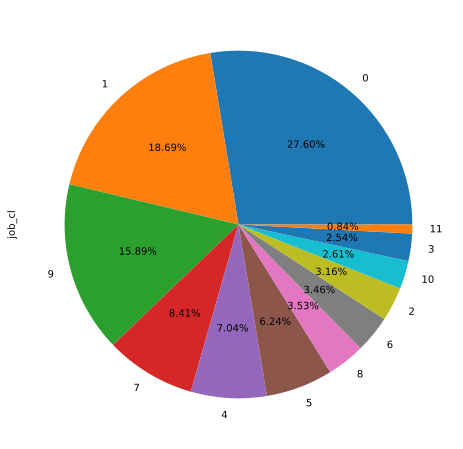

In [7]:
balanced_bank['job_cl'].value_counts().plot(kind = 'pie', autopct = '%1.2f%%', figsize = (15,8))

Также сравним количесво каждых рабочих от месяцев в году

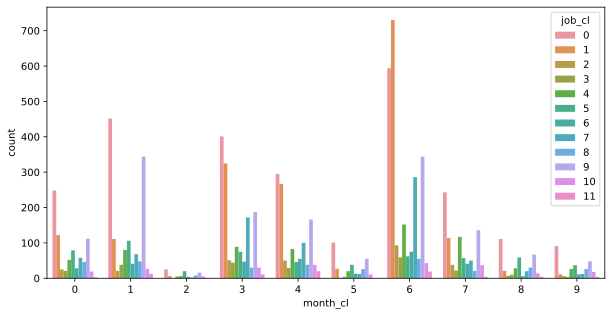

In [8]:
sns.countplot(x = 'month_cl', hue = 'job_cl', data = balanced_bank)

Рассмотрим диаграмму, где показывается соотношение кол-ва людей разных возрастов

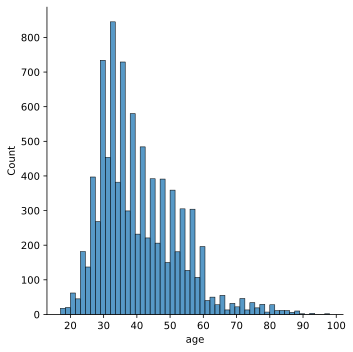

In [9]:
distplot = sns.displot(balanced_bank.age)

Познакомимся с первым таким "сложным" типом графиков pair plot (scatter plot matrix). Эта визуализация поможет нам посмотреть на одной картинке, как связаны между собой различные признаки. В данном примере представлена связь возраста человека, продолжительности их последнего контракта (в секундах), количество контактов, выполненных во время этой кампании и для этого клиента и индекса потребительских цен (месячный показатель).

In [11]:
c = ['age', 'duration', 'campaign', 'cons.price.idx']
sns_plot = sns.pairplot(balanced_bank[c])

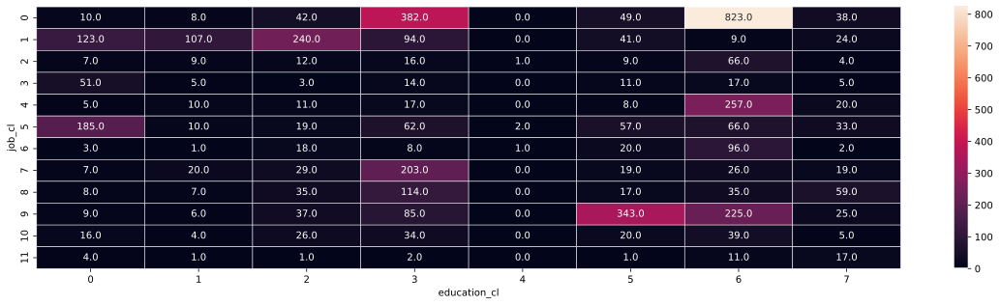

In [50]:
job_education_y = balanced_bank.pivot_table(
                        index='job_cl', 
                        columns='education_cl', 
                        values='y_cl', 
                        aggfunc=sum).fillna(0).applymap(float)
sns.heatmap(job_education_y, annot=True, fmt=".1f", linewidths=.5)

## Регрессия

In [12]:
Onion_Prices_2020 = pd.read_csv('Onion_Prices_2020_preprocessed.csv')
Onion_Prices_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 107295 entries, 0 to 107294
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Unnamed: 0    107295 non-null  int64  
 1   state_cl      107295 non-null  int64  
 2   district_cl   107295 non-null  int64  
 3   market_cl     107295 non-null  int64  
 4   commodity     107295 non-null  object 
 5   variety_cl    107295 non-null  int64  
 6   arrival_date  107295 non-null  object 
 7   min_price     107295 non-null  int64  
 8   max_price     107295 non-null  int64  
 9   modal_price   107295 non-null  float64
dtypes: float64(1), int64(7), object(2)
memory usage: 8.2+ MB


In [13]:
print(Onion_Prices_2020.dropna().shape)

(107295, 10)


Рассмотрим соотношение количества разных разновидностей лука

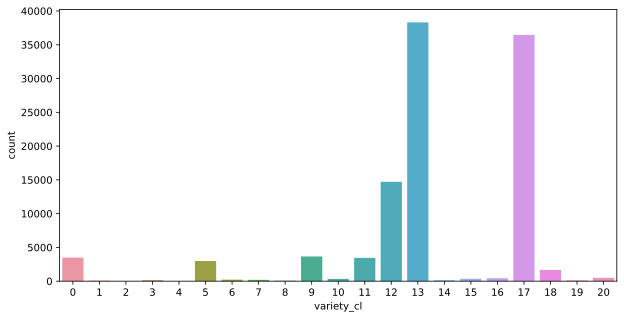

In [14]:
sns.countplot(x='variety_cl',data=Onion_Prices_2020)

Построим график максимальной, минимальной и модальной цены продаж лука в зависимости от разновидности.

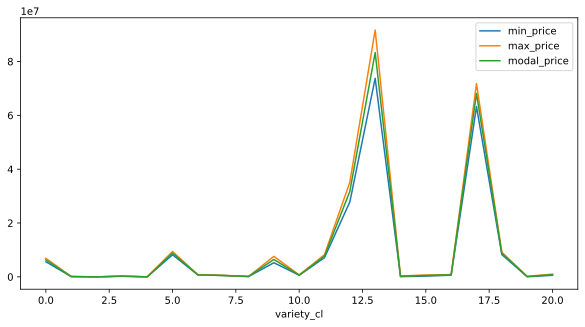

In [26]:
sales_df = Onion_Prices_2020[[x for x in Onion_Prices_2020.columns if 'price' in x] + ['variety_cl']]
sales_df.groupby('variety_cl').sum().plot()

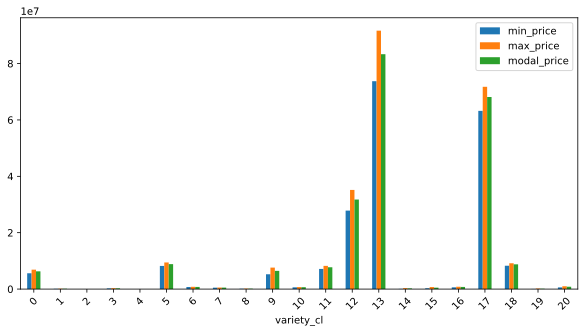

In [27]:
sales_df.groupby('variety_cl').sum().plot(kind='bar', rot=45)

С помощью seaborn можно построить и распределение dist plot. Рассмотрим на кол-во лука в разных штатах.

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


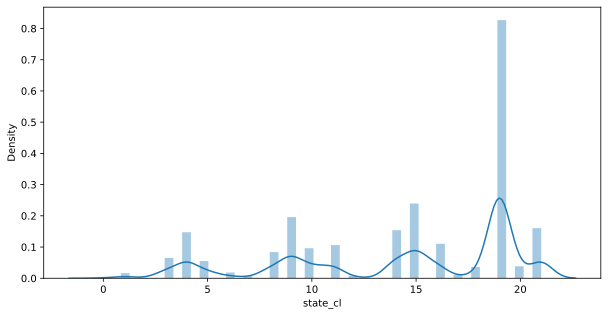

In [17]:
sns.distplot(Onion_Prices_2020.state_cl)

Heat map позволяет посмотреть на распределение какого-то численного признака по двум категориальным. Визуализируем суммарные продажи лука в разных штатах и разной разновидности.

In [44]:
rcParams['figure.figsize'] = 20, 5

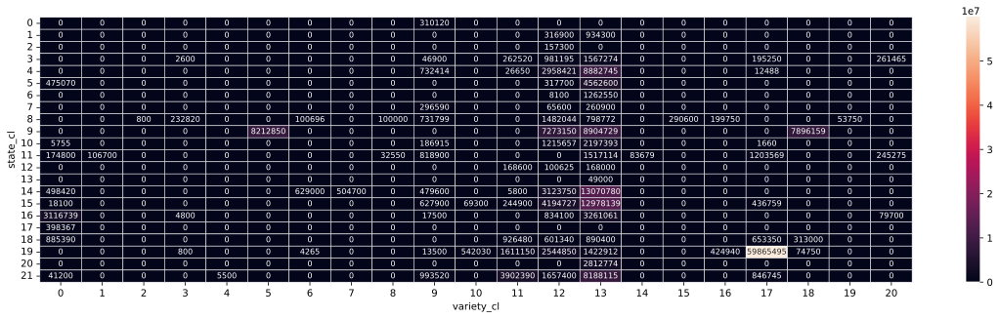

In [48]:
state_variety_prices = Onion_Prices_2020.pivot_table(
                        index='state_cl', 
                        columns='variety_cl', 
                        values='min_price', 
                        aggfunc=sum).fillna(0).applymap(float)
sns.heatmap(state_variety_prices, annot=True, fmt=".0f", linewidths=.5, annot_kws={"fontsize":8})